**Kernel**
- [Basic of Statistical Viz : Plotly & Seaborn](https://www.kaggle.com/subinium/basic-of-statistical-viz-plotly-seaborn)

**Dataset**
- [Students Performance in Exams](https://www.kaggle.com/spscientist/students-performance-in-exams)

## Plotly & Seaborn

### Table of Contents 
- **Starter Code**
    - dataset description
    - before we start Plotly
    - Check Null Data (missingno)
- **Table View**
    - default notebook
    - plotly : ```go.Table```
- **Countplot**
    - seaborn : ```countplot```, ```barplot``` + ```value_counts()```
    - plotly : ```px.histogram```, ```go.Histogram```
- **Distplot**
    - seaborn : ```distplot```
    - plotly : ```ff.creat_distplot```
- **Scatterplot**
    - seaborn : ```scatterplot```
    - plotly : ```px.scatter```, ```go.Scatter```, ```go.Scattergl```
- **Boxplot**
    - seaborn : ```boxplot```, ```stripplot```, ```swarmplot```
    - plotly : ```px.box```, ```go.Box```
- **Violinplot**
    - seaborn : ```violinplot```
    - plotly : ```px.violin```, ```go.Violin```
- **Jointplot**
    - seaborn : ```jointplot```
    - plotly : ```go.Histogram2dContour```, ```go.Histogram```
- **ETC**
    - plotly : ```px.treemap```, ```px.sunburst```

## Starter Code

In [1]:
# Data Processing
import numpy as np
import pandas as pd

# Basic Visualization tools
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 300

data = pd.read_csv('data/StudentsPerformance.csv')

### Dataset description
| Feature | More Info |
| --- | --- |
| gender | [male, female] |
| race/ethnicity | 	[group A to E ] |
| parental level of education | categorical value |
| lunch | |
| test preparation course | |
| math score	 | numeric score (int, not float) |
| reading score	 | numeric score (int, not float) |
| writing score	 | numeric score (int, not float) |

### Before we start Plotly...
- Plotly's main object is Figure() object.
- add_trace can consider as 'stacking figures'.
- I will use these libraries :
    - ```import plotly.graph_objects as go```
    - ```import plotly.express as px```
    - ```import plotly.figure_factory as ff```

### Check Null Data

<AxesSubplot:>

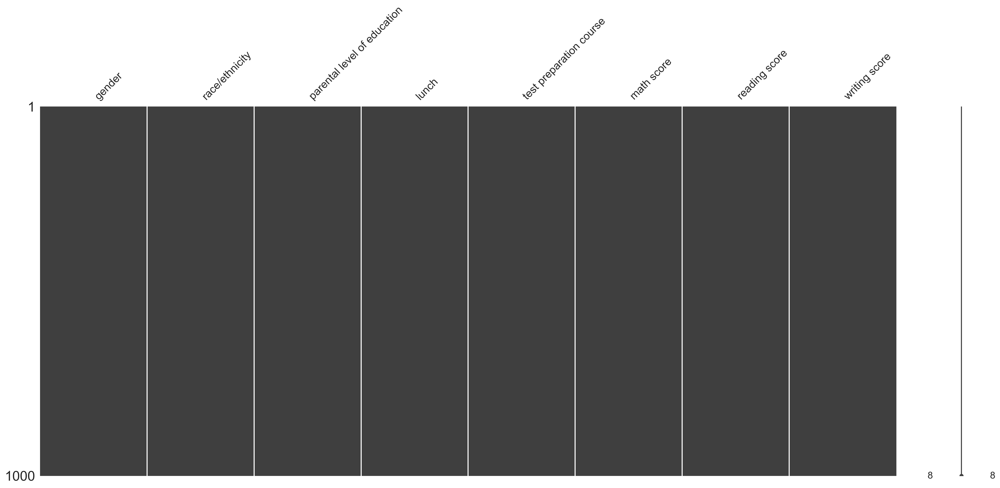

In [2]:
import missingno as msno
msno.matrix(data)

## Table View

### default notebook

In [3]:
data.head()

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


### Plotly : go.Table
```go.Table``` provides a Table object for detailed data viewing.

In [4]:
# type 1 : default

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Table(header=dict(values=data.columns),
             cells=dict(values=data.head(3).T))
)

fig.show()

set ```fill_color``` parameter to change background color

In [5]:
# type 2 : change color

fig = go.Figure()

fig.add_trace(
    go.Table(header=dict(values=data.columns, fill_color='paleturquoise'),
             cells=dict(values=data.head(3).T, fill_color='lavender'))
)

fig.show()

## Countplot

### Seaborn : countplot, barplot + value_counts()
- Countplot : Show the counts of observations in each categorical bin using bars.

**Little tips**
- If you want to make it vertical, replace x by y.
- Use ```alpha``` parameter to set opacity for more readable plot
- Use ```hue``` to find features' trend
- use ```plt.xticks``` or ```plt.yticks``` to rotation xaxis label.

No handles with labels found to put in legend.


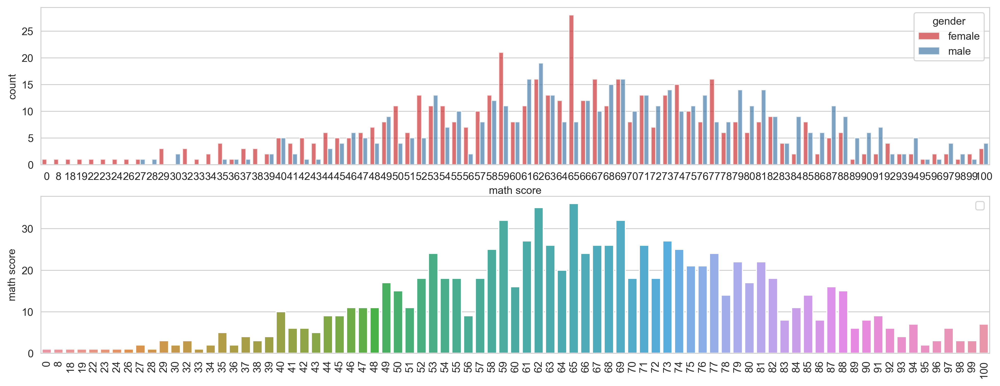

In [6]:
fig, ax = plt.subplots(2, 1, figsize=(16, 6))

# type 1 : use hue parameter
sns.countplot(x='math score', data=data, hue='gender', palette='Set1', alpha=0.7, ax=ax[0])
plt.legend()
plt.xticks(rotation='vertical')

# type 2 : use value_counts + barplot / hard to divide like hue
sns.barplot(x=data['math score'].value_counts().index, y=data['math score'].value_counts(), ax=ax[1])
plt.show()

### Plotly : px.histogram, go.Histogram
Plotly doesn't have countplot. But with simple trick, we can make countplot. (or You can use value_counts + bar trick again)

```plotly.express``` and ```plotly.graph_objects``` have histogram plot.

we can set x and y parameter same feature(it means y is number of x), and set color like hue.

In [7]:
import plotly.express as px

# type 1 : Stacked graph (default)

fig = px.histogram(data, x='math score', y='math score', color='gender')
fig.show()

# type 2 : group

fig = px.histogram(data, x='math score', y='math score', color='gender')
fig.update_layout(barmode='group')
fig.show()

You can add marginal parameter to show simple distribution.

As you will see below, the marginal part above is set to boxplot.

It is a graph that shows the quadrant, the median and the outlier.

In [8]:
fig = px.histogram(data, x='math score', y='math score', color='gender',
                   marginal='box'  # or violin, rug
                  )
fig.show()

## Distplot

### Seaborn : distplot
- Distplot : Flexibly plot a univariate distribution of observations.

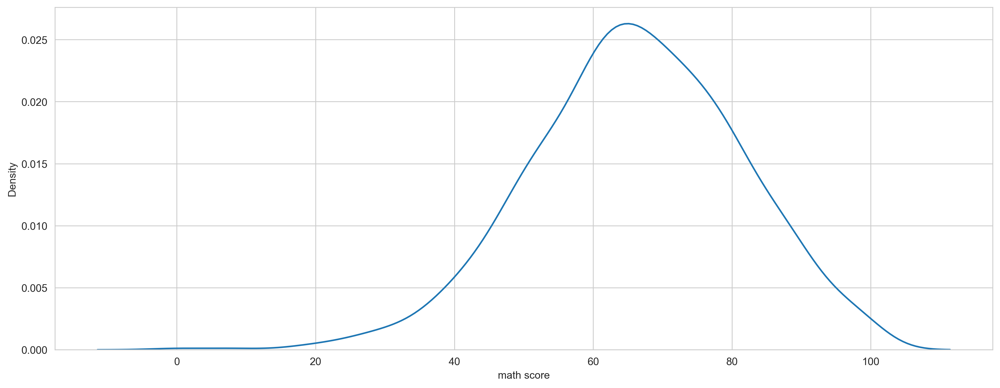

In [9]:
# type 1 : default view

fig, ax = plt.subplots(1, 1, figsize=(16, 6))
sns.kdeplot(data['math score'])
plt.show()

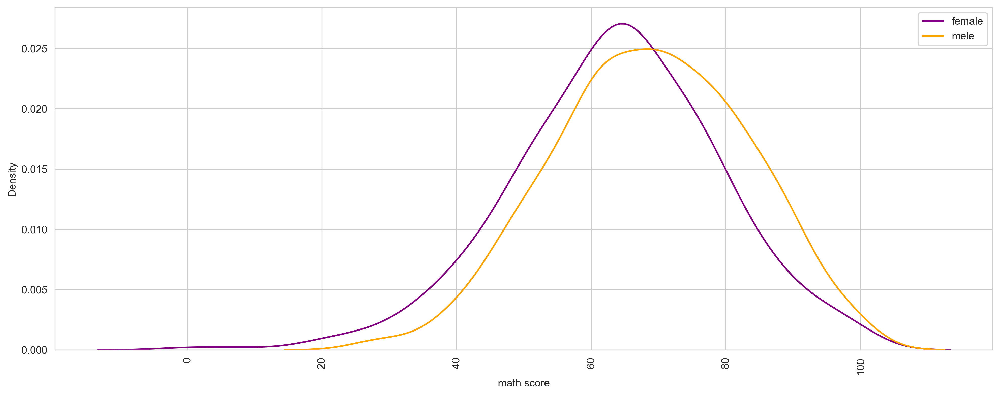

In [10]:
# type 2 : draw 2 graph with label

fig, ax = plt.subplots(1, 1, figsize=(16, 6))
sns.kdeplot(data[data['gender']=='female']['math score'], color='purple', ax=ax, label='female')
sns.kdeplot(data[data['gender']=='male']['math score'], color='orange', ax=ax, label='mele')
plt.xticks(rotation='vertical')
plt.legend()
plt.show()

Although extra, you can also add a mean line using matplotlib.

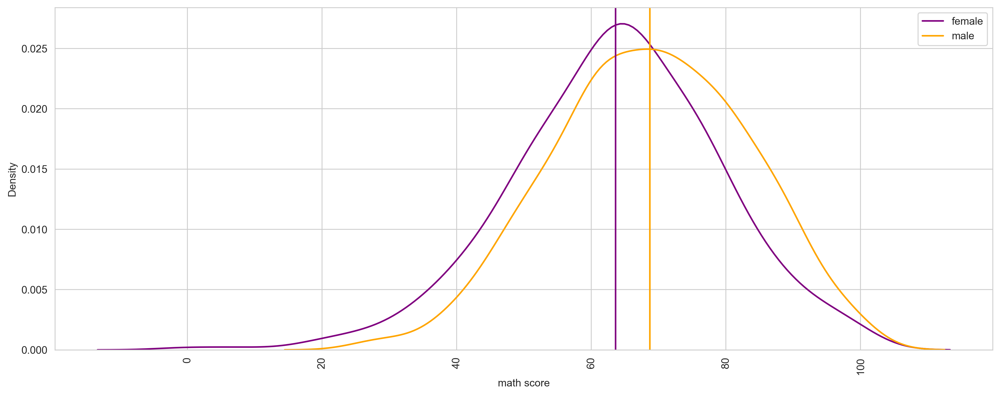

In [11]:
# type 3 : add avg line
fig, ax = plt.subplots(1, 1, figsize=(16, 6))
sns.kdeplot(data[data['gender']=='female']['math score'], color='purple', ax=ax, label='female')
sns.kdeplot(data[data['gender']=='male']['math score'], color='orange', ax=ax, label='male')

# avg line
plt.axvline(data[data['gender']=='female']['math score'].mean(), color='purple')
plt.axvline(data[data['gender']=='male']['math score'].mean(), color='orange')

plt.legend()
plt.xticks(rotation='vertical')
plt.show()

### Plotly : ff.creat_distplot

In [12]:
# type 1 : default
import plotly.figure_factory as ff

fig = ff.create_distplot([data[data['gender']=='male']['math score'], data[data['gender']=='female']['math score']], ['male', 'female'])
fig.show()

In [13]:
# type 2 : add color and change bin width

fig = ff.create_distplot([data[data['gender']=='male']['math score'], data[data['gender']=='female']['math score']], 
                         ['male', 'female'], 
                         colors = ['#1BCDC1', '#F66095'], 
                         bin_size = [2, 2])
fig.show()

In [14]:
# type 3 : change view (rug, hist, curve)

fig = ff.create_distplot([data[data['gender']=='male']['math score'], data[data['gender']=='female']['math score']],
                         ['male', 'female'],
                         colors = ['#2BCDC1', '#F66095'],
                         bin_size = [2, 2],
                         show_rug = False,   # rug
                         show_hist = False,  # hist
                         show_curve = True   # curve
                        )
fig.show()

## Scatter Plot

### Seaborn : scatterplot
- Scatter plot : Draw a scatter plot with possibility of several semantic groupings.

**Custom parameter**
1. ```hue``` : Color change by category
2. ```style``` : marker (+, o, -, etc)
3. ```size``` : point size

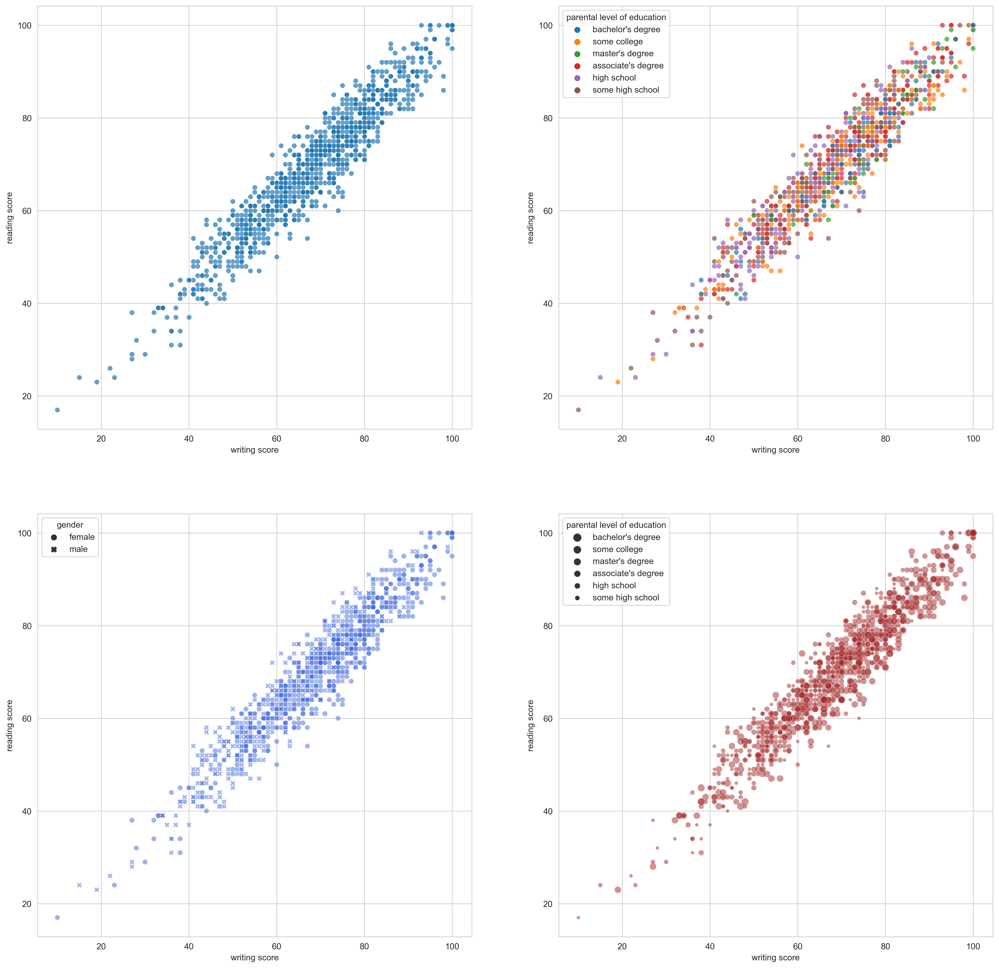

In [15]:
fig, ax = plt.subplots(2, 2, figsize=(20, 20))

# type 1 : default scatter plot
sns.scatterplot(data=data, x='writing score', y='reading score', alpha=0.7, ax=ax[0][0])

# type 2 : with hue
sns.scatterplot(data=data, x='writing score', y='reading score', hue='parental level of education', alpha=0.7, ax=ax[0][1])

# type 3 : with style & color
sns.scatterplot(data=data, x='writing score', y='reading score', style='gender', color='royalblue', alpha=0.5, ax=ax[1][0])

# type 4 : with size & color
sns.scatterplot(data=data, x='writing score', y='reading score', size='parental level of education', color='brown', alpha=0.5, ax=ax[1][1])

plt.show()

If you use them all together, you can plot high-dimensional data on a two-dimensional plane.

However, this data is not very efficient, so I recommend using it occasionally.

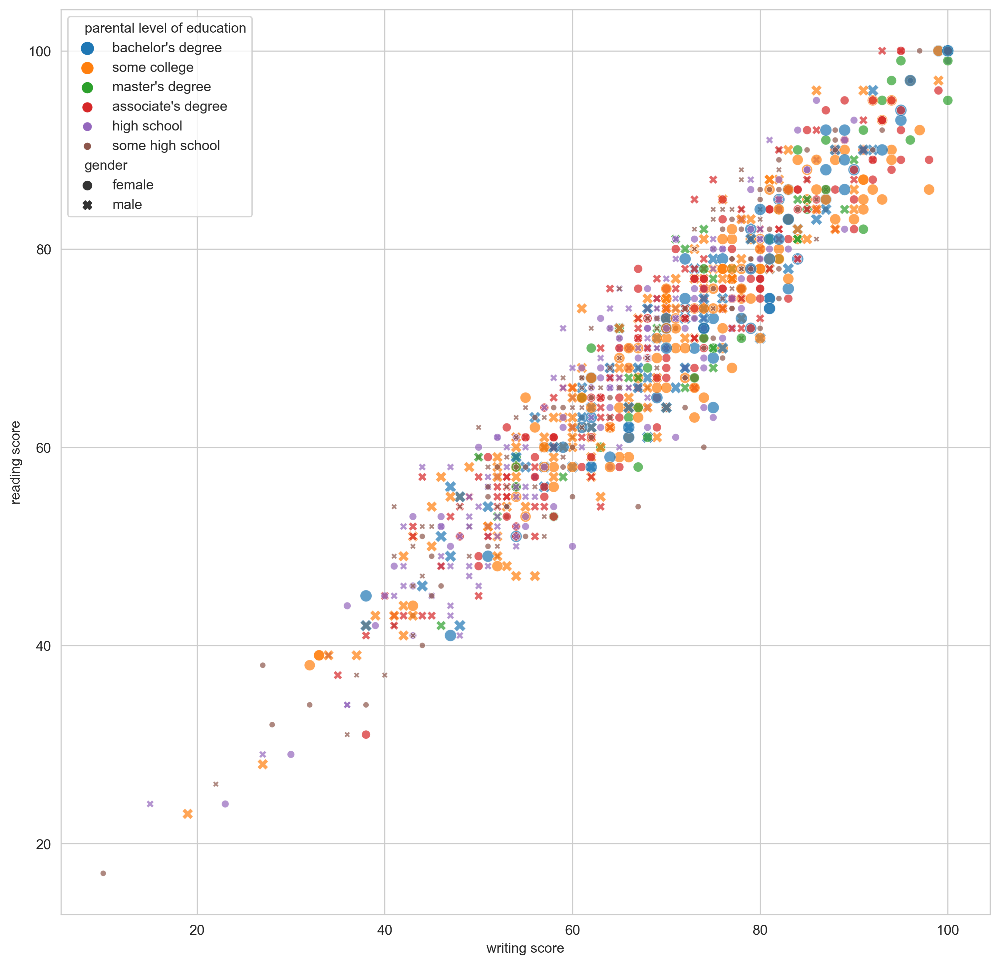

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
sns.scatterplot(data=data, x='writing score', y='reading score', style='gender', hue='parental level of education', size='parental level of education', alpha=0.7)
plt.show()

### Plotly : px.scatter, go.Scatter, go.Scattergl

In [17]:
# type 1 : default
fig = px.scatter(data, x='writing score', y='reading score')
fig.show()

In [18]:
# type 2 : use color as seaborn hue

fig = px.scatter(data, x='writing score', y='reading score', color='parental level of education', opacity=0.5)
fig.show()

To use size, the feature must be numeric. so Let's encode ```parental level of education```.

In [19]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
data['parental level of education'] = LE.fit_transform(data['parental level of education'])

In [20]:
# type 3 : with size & color
fig = px.scatter(data, x='writing score', y='reading score',
                 color='parental level of education',
                 size='parental level of education')
fig.show()

## Box Plot

### Seaborn : boxplot, stripplot, swarmplot
- boxplot : Draw a box plot to show distributions with respect to categories.
- stripplot : Draw a scatterplot where one variable is categorical.
- swarmplot : Draw a categorical scatterplot with non-overlapping points.


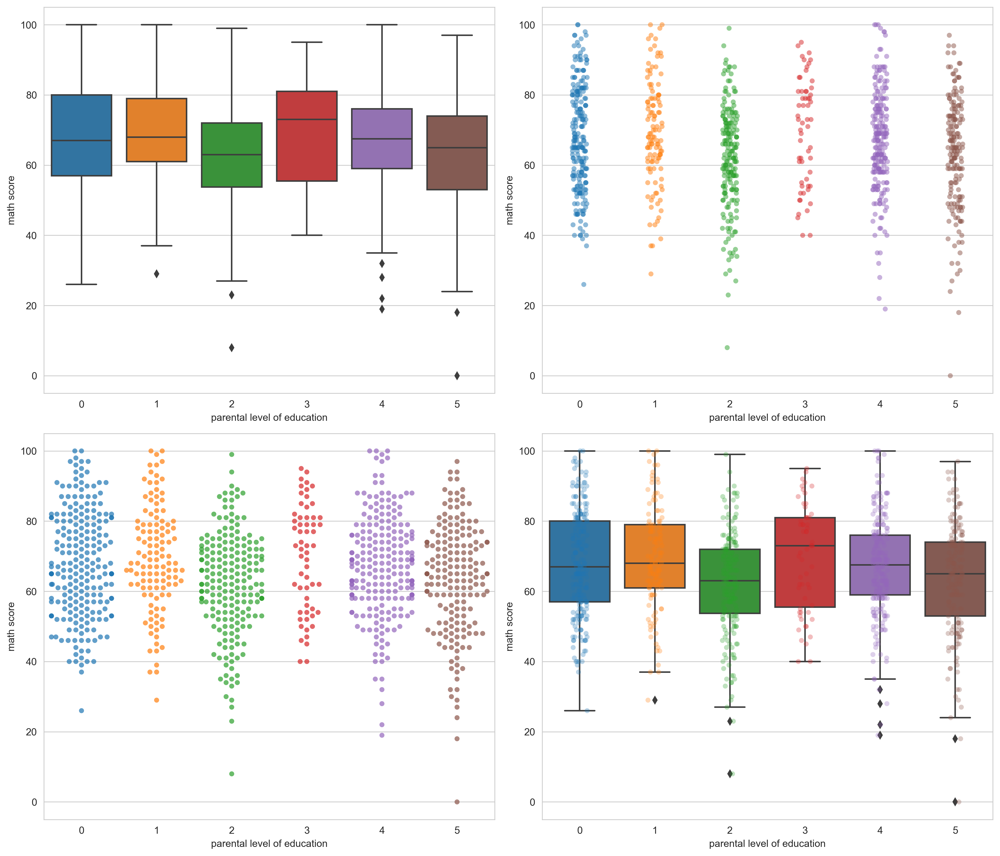

In [21]:
# type 1 : default boxplot & stripplot

fig, ax = plt.subplots(2, 2, figsize=(14, 12))

# boxplot
sns.boxplot(x='parental level of education', y='math score', data=data, ax=ax[0][0])

# stripplot
sns.stripplot(x='parental level of education', y='math score', data=data, ax=ax[0][1], alpha=0.5)

# swarmplot
sns.swarmplot(x='parental level of education', y='math score', data=data, ax=ax[1][0], alpha=0.7)

# both
sns.boxplot(x='parental level of education', y='math score', data=data, ax=ax[1][1])
sns.stripplot(x='parental level of education', y='math score', data=data, ax=ax[1][1], alpha=0.3)

plt.tight_layout()
plt.show()

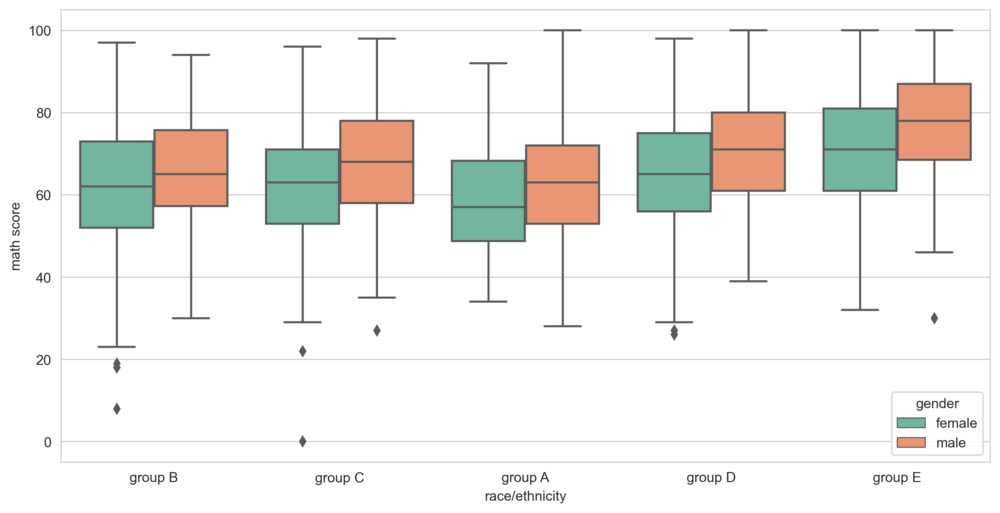

In [22]:
# type 2 : we can add hue parameter

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
sns.boxplot(x='race/ethnicity', y='math score', hue='gender', palette='Set2', data=data, ax=ax)
plt.show()

### Plotly : px.box, go.Box

In [23]:
# type 1 : default boxplot
fig = px.box(data, x='parental level of education', y='math score')
fig.show()

In [24]:
# type 2 : boxplot with stipplot

fig = px.box(data, x='parental level of education', y='math score', points='all')
fig.show()

In [25]:
# type 3 : boxplot with stripplot + color
fig = px.box(data, x='parental level of education', y='math score', color='gender', points='all')
fig.show()

## Violin Plot

### Seaborn : violinplot
- violinplot : Draw a combination of boxplot and kernel density estimate.

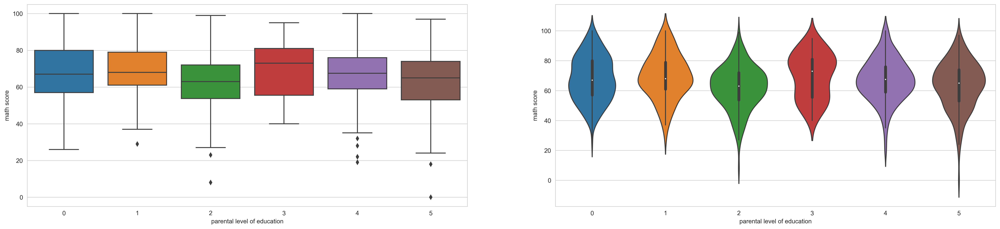

In [26]:
# type 1 : compare with boxplot

fig, ax = plt.subplots(1, 2, figsize=(28, 6))

# boxplot
sns.boxplot(x='parental level of education', y='math score', data=data, ax=ax[0])

# violinplot
sns.violinplot(x='parental level of education', y='math score', data=data, ax=ax[1])

plt.show()

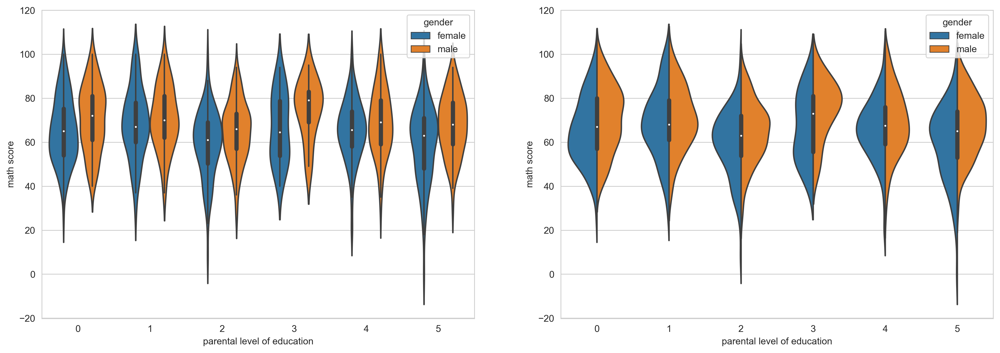

In [27]:
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

# type 2 : hue parameter
sns.violinplot(x='parental level of education', y='math score', hue='gender', data=data, ax=ax[0])

# type 3 : hue + split
sns.violinplot(x='parental level of education', y='math score', hue='gender', data=data, split=True, ax=ax[1])
plt.show()

### Plotly : px.violin, go.Violin

In [28]:
# type 1 : default violinplot

fig = px.violin(data, x='parental level of education', y='math score')
fig.show()

In [29]:
# type 2 : color add violin

fig = px.violin(data, x='parental level of education', y='math score', 
                color='gender')
fig.show()

In [30]:
# type 3 : color + violinmode

fig = px.violin(data, x='parental level of education', y='math score',
                color='gender',
                violinmode='overlay')
fig.show()

In [31]:
# type 4 : go.box usage

fig = go.Figure()

fig.add_trace(
    go.Violin(x=data['parental level of education'], y=data['math score'],
              box_visible=True,  # with box plot
              line_color='black',
              meanline_visible=True,  # with mean value
              fillcolor='lightseagreen',
              opacity=0.6)
)

fig.show()

## Joint Plot

### Seaborn : jointplot
- Joint Plot : Draw a plot of two variables with bivariate and univariate graphs.

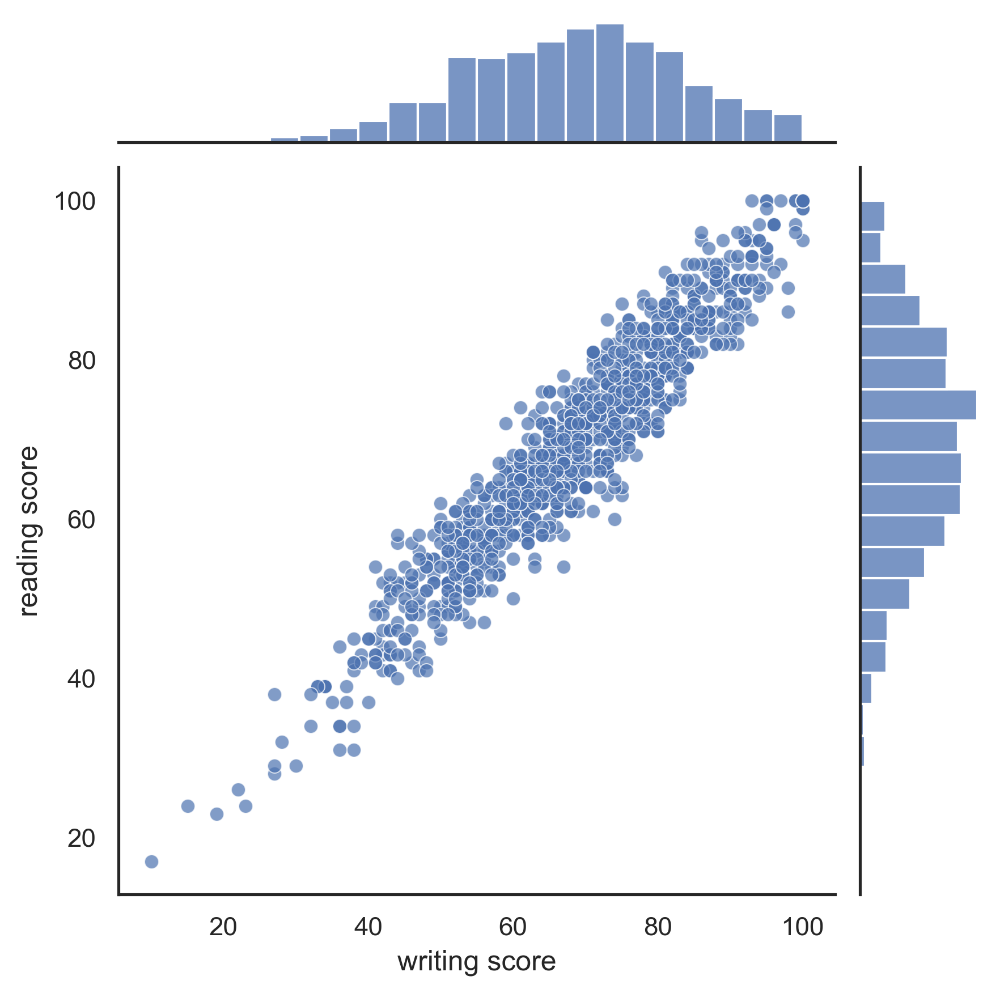

In [32]:
# type 1 : default

sns.set(style='white', color_codes=True) # suitable theme for jointplot
sns.jointplot(data=data, x='writing score', y='reading score', alpha=0.7)
plt.show()

There are three types: 

reg of regression, hex of hexagon, and kde of kde.

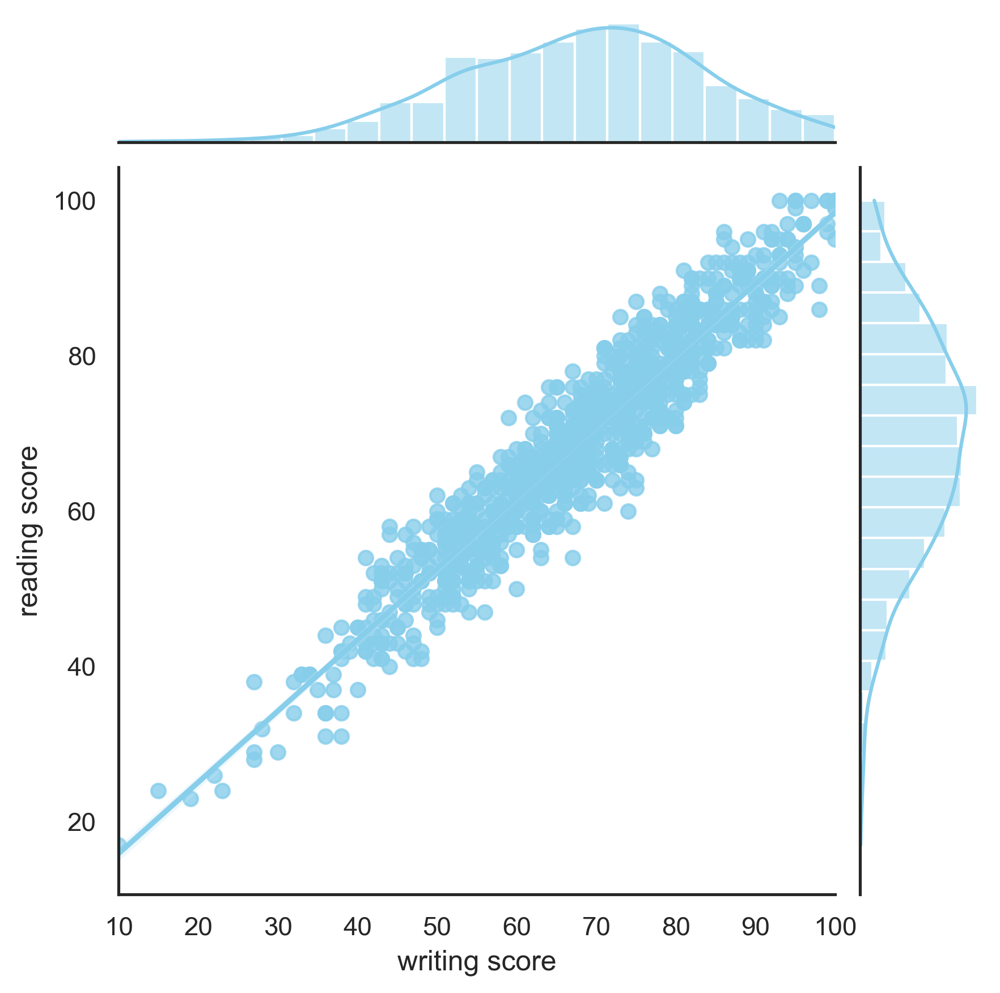

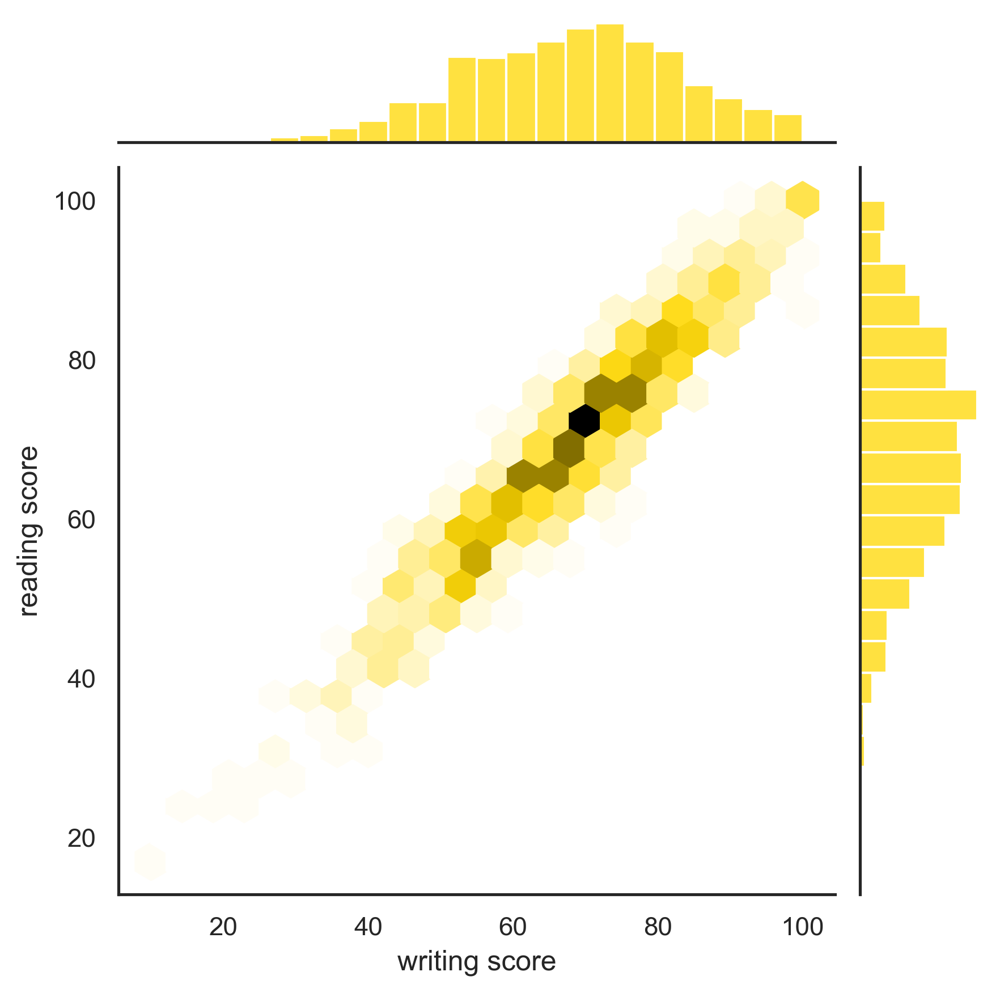

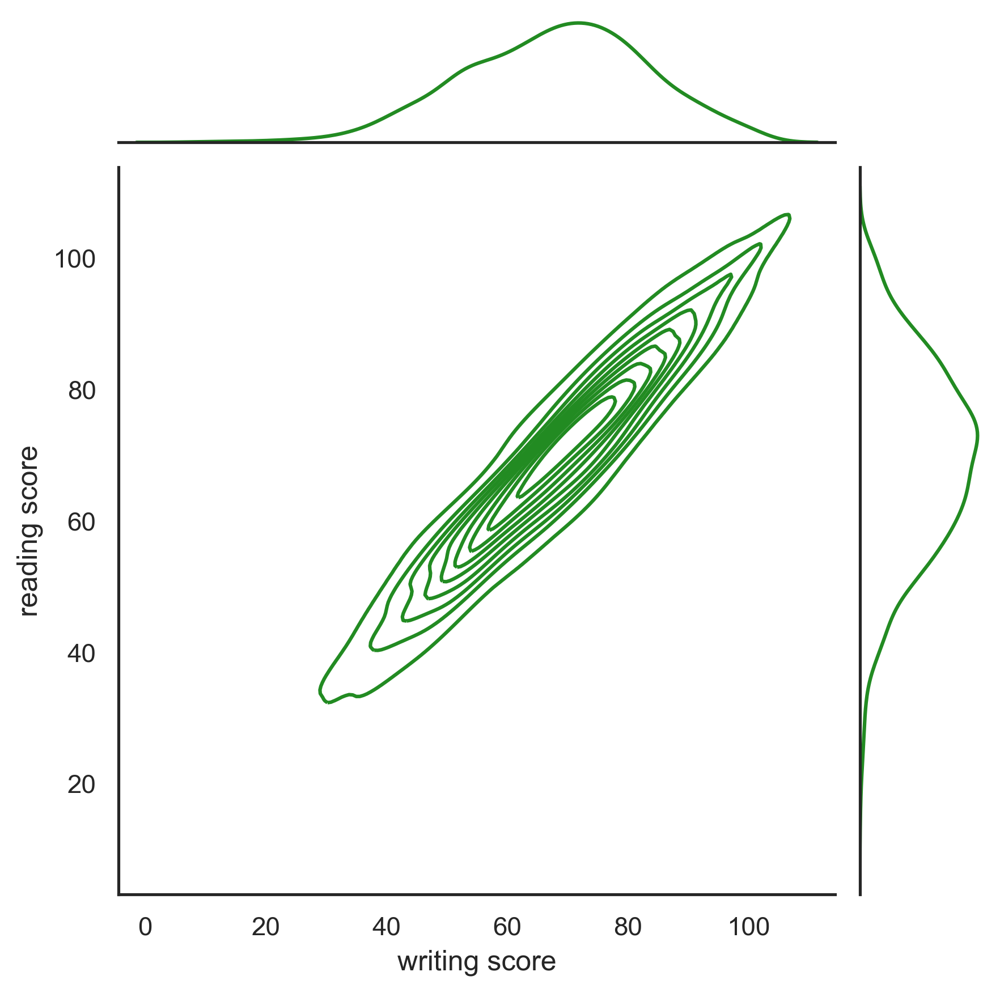

In [36]:
# type 2 : many types (reg, hex, kde)

sns.jointplot(data=data, x='writing score', y='reading score', kind='reg', color='skyblue')
plt.show()

sns.jointplot(data=data, x='writing score', y='reading score', kind='hex', color='gold')
plt.show()

sns.jointplot(data=data, x='writing score', y='reading score', kind='kde', color='forestgreen')
plt.show()

### Plotly : go.Histogram2d, go.Histogram2dContour, go.Scatter

In [37]:
# type 1 : 2d histogram + such as heatmap

fig = go.Figure()

fig.add_trace(go.Histogram2d(
    x=data['writing score'], y=data['reading score'],
    nbinsx=30, nbinsy=30,
    colorscale='Blues'
))

fig.show()

In [38]:
# type 2 : 2d histogram countour

fig = go.Figure()

fig.add_trace(go.Histogram2dContour(
    x=data['writing score'], y=data['reading score'],
    nbinsx=30, nbinsy=30,
    colorscale='Blues'
))

fig.show()

In [40]:
# type 3 : Histogram2dContour + Scatter + Histogram

fig = go.Figure()

fig.add_trace(go.Histogram2dContour(
    x=data['writing score'], y=data['reading score'],
    nbinsx=30, nbinsy=30,
    colorscale='Blues',
    xaxis='x', yaxis='y'
))

fig.add_trace(go.Scatter(
    x=data['writing score'], y=data['reading score'],
    xaxis='x', yaxis='y',
    mode='markers',
    marker=dict(
        color='rgba(0,0,0,0.3)',
        size=3
    )
))

# Side dist
fig.add_trace(go.Histogram(
    y=data['reading score'],
    xaxis='x2',
    marker=dict(
        color='rgba(0,0,0,1)'
    )
))

# Side dist
fig.add_trace(go.Histogram(
    x=data['writing score'],
    yaxis='y2',
    marker=dict(
        color='rgba(0,0,0,1)'
    )
))

fig.update_layout(
    autosize = False,
    xaxis = dict(
        zeroline = False,
        domain = [0, 0.85],
        showgrid = False
    ),
    yaxis = dict(
        zeroline = False,
        domain = [0, 0.85],
        showgrid = False
    ),
    xaxis2 = dict(
        zeroline = False,
        domain = [0.85, 1],
        showgrid = False
    ),
    yaxis2 = dict(
        zeroline = False,
        domain = [0.85, 1],
        showgrid = False
    ),
    height = 600,
    width = 600,
    bargap = 0,
    hovermode = 'closest',
    showlegend = False
)

fig.show()

```marginal_x``` and ```marginal_y``` can be used to represent the distribution for each axis.

In [41]:
# type 4 : marginal_x & marginal_y

fig = px.scatter(data, x='writing score', y='reading score', marginal_y='rug', marginal_x='histogram')
fig.show()

## ETC
For hierarchical visualization, you can use Treemap & Sunburst Chart.

### Plotly : px.treemap, px.sunburst

In [43]:
data = pd.read_csv('data/StudentsPerformance.csv')
data['total'] = 1
fig = px.treemap(data, path=['race/ethnicity', 'parental level of education'], values='total')
fig.show()

In [44]:
fig = px.sunburst(data, path=['race/ethnicity', 'parental level of education'], values='total')
fig.show()